Basic Generative Adversarial Networks(GANs)

In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

C:\Users\changjun\anaconda3\envs\tf_gpu\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\changjun\anaconda3\envs\tf_gpu\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\Users\changjun\anaconda3\envs\tf_gpu\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
WIDTH = 28
HEIGHT = 28

def make_grid(images, nrow=5):
    n, h, w = images.shape
    ncol = (int)(n / 5)
    grid = np.zeros((ncol*h, nrow*w))

    idx = 0
    for i in range(ncol):
        for j in range(nrow):
            grid[HEIGHT*i:HEIGHT*(i+1), WIDTH*j:WIDTH*(j+1)] = images[idx]
            idx += 1
    
    return grid

def show_tensor_images(image_tensor, num_images=25):
    image_unflat = image_tensor.numpy().reshape(-1, HEIGHT, WIDTH)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid, cmap='gray')
    plt.show()

In [3]:
(x_train,y_train),(x_test,y_test) = tf.keras.datasets.mnist.load_data()

## Generator

In [4]:
def get_generator_block(output_dim):
    return keras.Sequential([
        keras.layers.Dense(output_dim),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU()
    ])

In [5]:
class Generator(tf.keras.Model):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()

        self.gen = keras.Sequential()
        self.gen.add(keras.layers.Input(z_dim))
        self.gen.add(get_generator_block(hidden_dim))
        self.gen.add(get_generator_block(hidden_dim * 2))
        self.gen.add(get_generator_block(hidden_dim * 4))
        self.gen.add(get_generator_block(hidden_dim * 8))
        self.gen.add(keras.layers.Dense(im_dim, activation='sigmoid'))
    
    def call(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
        return self.gen

## Noise

In [6]:
def get_noise(n_samples, z_dim):
    return tf.random.normal([n_samples, z_dim])

## Discriminator

In [7]:
def get_discriminator_block(output_dim):
    return keras.Sequential([
        keras.layers.Dense(output_dim),
        keras.layers.LeakyReLU(0.2),
    ])

In [8]:
class Discriminator(keras.Model):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = keras.Sequential()
        self.disc.add(keras.layers.Input(im_dim))
        self.disc.add(get_discriminator_block(hidden_dim * 4))
        self.disc.add(get_discriminator_block(hidden_dim * 2))
        self.disc.add(get_discriminator_block(hidden_dim))
        self.disc.add(keras.layers.Dense(1, activation='sigmoid'))
    
    def call(self, image):
        return self.disc(image)
    
    def get_disc(self):
        return self.disc

## Training

In [9]:
n_epochs = 200
z_dim = 64
display_step = 1000
batch_size = 128
learning_rate = 1e-5

def map_fn(x, y):
    x = tf.cast(x, tf.float32)
    x = tf.reshape(x, (WIDTH*HEIGHT,))
    x = x / 255.0

    return x

train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_dataset = train_dataset.map(map_fn).shuffle(1024).batch(batch_size)

In [10]:
BCELoss = keras.losses.BinaryCrossentropy(from_logits=False)

In [11]:
gen = Generator(z_dim)
gen_opt = keras.optimizers.Adam(learning_rate)
disc = Discriminator()
disc_opt = keras.optimizers.Adam(learning_rate)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: 3.2292963901758185, Discriminator loss: 0.2293152240663768


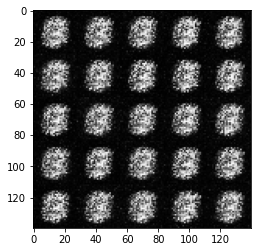

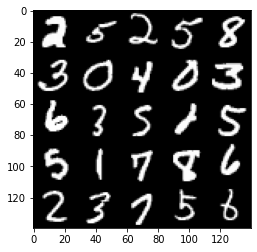

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 3.3284156591892233, Discriminator loss: 0.13070839762687683


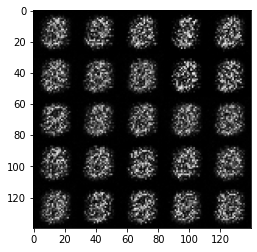

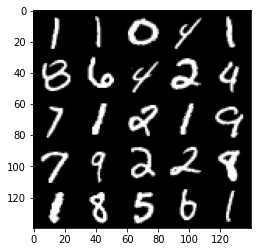

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 2.466532372593882, Discriminator loss: 0.28053603927791093


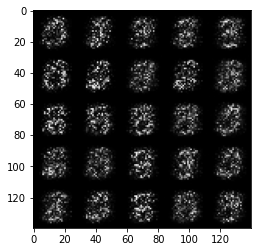

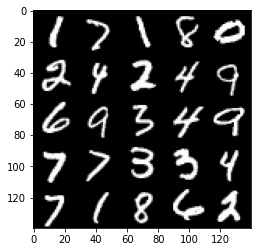

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 2.514495432138447, Discriminator loss: 0.24261121302843094


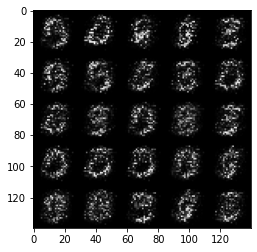

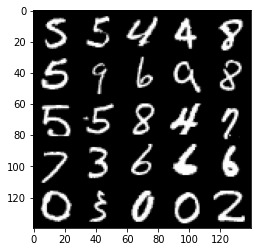

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 3.0506738049983975, Discriminator loss: 0.1820585832968352


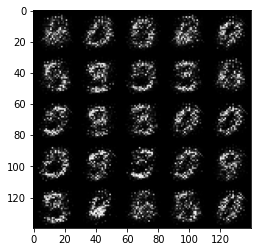

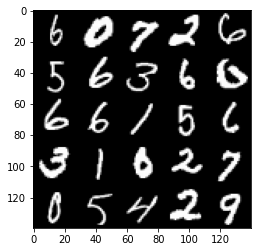

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 3.537703920602798, Discriminator loss: 0.15274507103115306


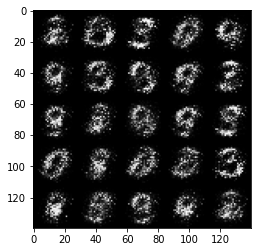

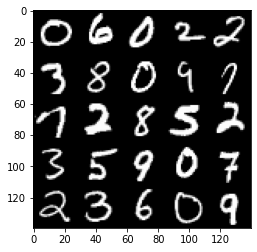

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 3.8820026035308803, Discriminator loss: 0.13188463858515018


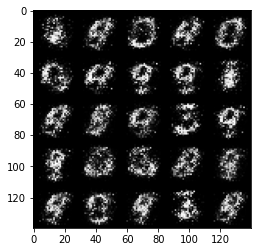

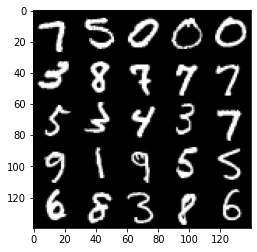

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 4.191916692256923, Discriminator loss: 0.11436220861971395


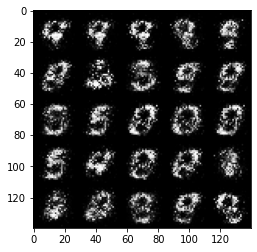

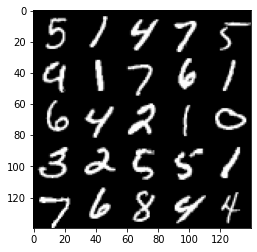

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 4.198705740213394, Discriminator loss: 0.11313100279122582


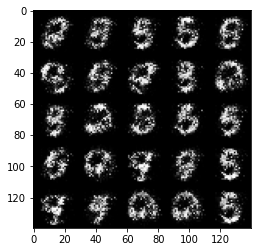

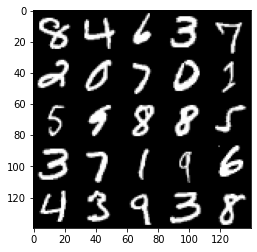

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 4.376384452104568, Discriminator loss: 0.11216067298874256


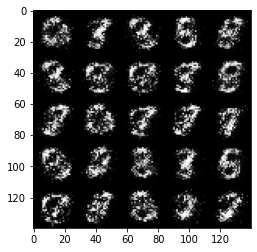

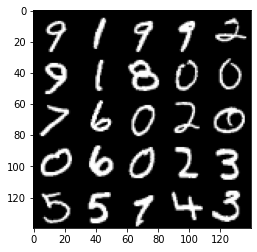

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 11000: Generator loss: 4.375314603328706, Discriminator loss: 0.1284755533225834


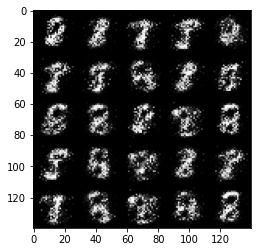

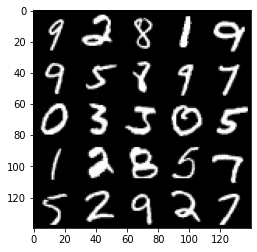

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 12000: Generator loss: 4.12202284002304, Discriminator loss: 0.13351431227475394


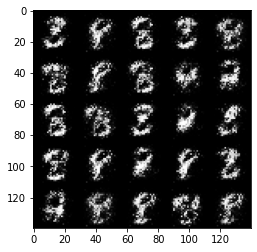

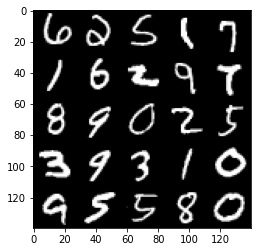

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 13000: Generator loss: 4.136250548362735, Discriminator loss: 0.12445311413332827


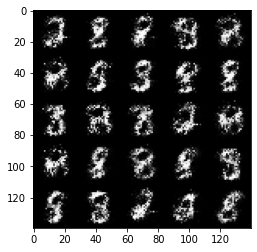

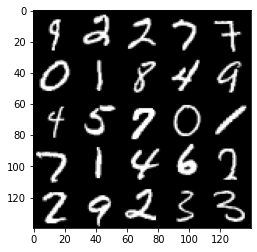

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 14000: Generator loss: 4.231851086854933, Discriminator loss: 0.1359807803668079


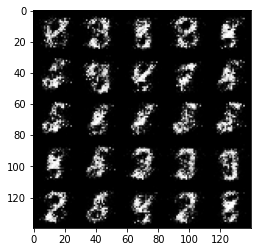

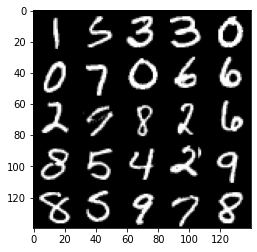

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 15000: Generator loss: 3.9750521309375797, Discriminator loss: 0.16756933601573093


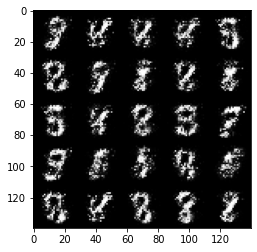

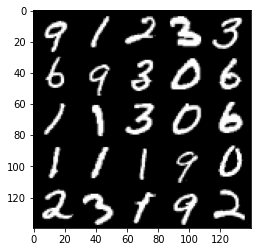

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 4.073551984310153, Discriminator loss: 0.16626298772543657


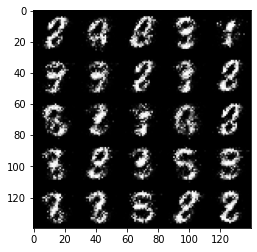

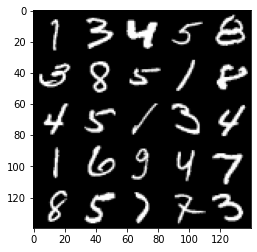

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 3.741448635578162, Discriminator loss: 0.19763417698442945


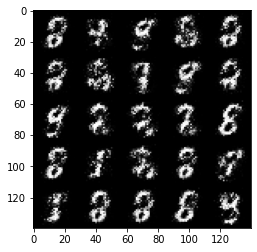

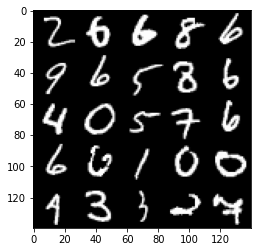

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 3.6745298106670385, Discriminator loss: 0.2192207691222428


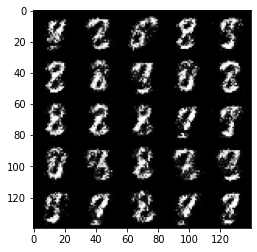

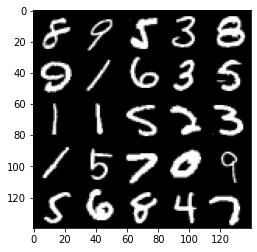

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 19000: Generator loss: 3.636654629707332, Discriminator loss: 0.20698636005818827


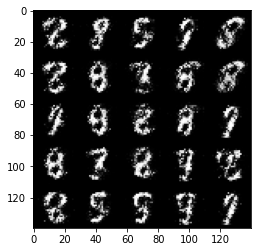

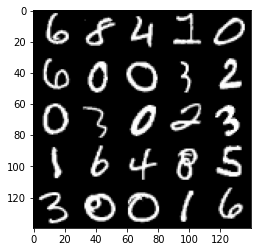

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 20000: Generator loss: 3.5421162793636327, Discriminator loss: 0.24260163978487256


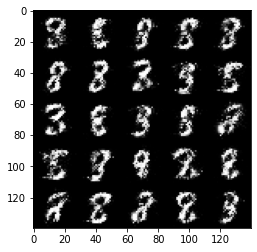

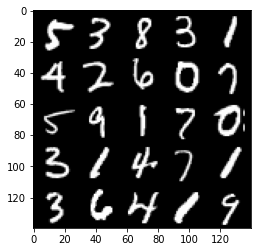

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 21000: Generator loss: 3.249154721498495, Discriminator loss: 0.2797912153825165


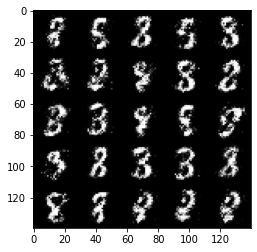

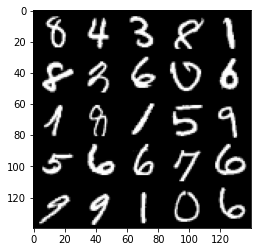

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 22000: Generator loss: 3.346193610191348, Discriminator loss: 0.2926426975429055


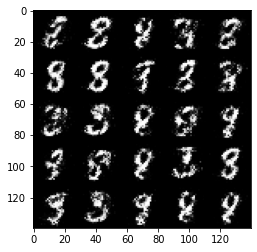

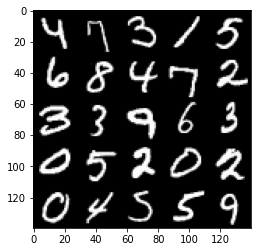

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49, step 23000: Generator loss: 3.267077739953989, Discriminator loss: 0.29604204462468586


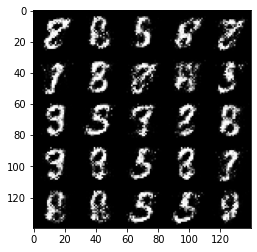

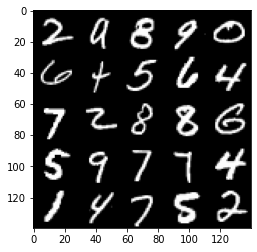

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 51, step 24000: Generator loss: 3.1946316318511974, Discriminator loss: 0.3298840711116793


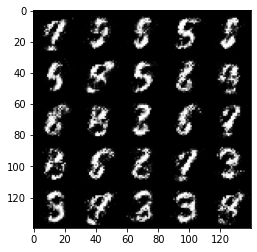

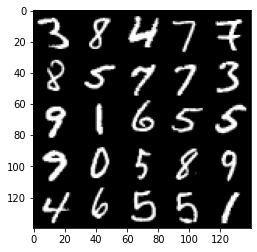

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 53, step 25000: Generator loss: 3.1422196598052987, Discriminator loss: 0.32252608515322206


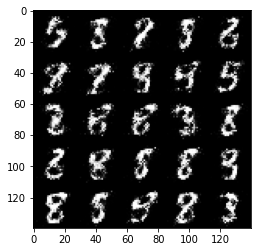

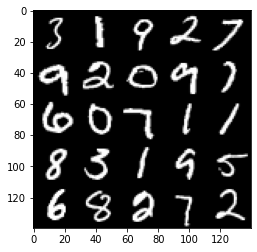

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 55, step 26000: Generator loss: 2.9147206037044544, Discriminator loss: 0.37114242601394626


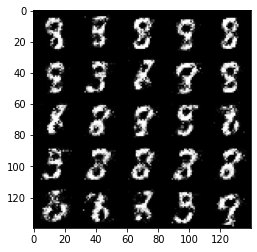

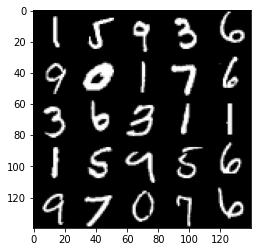

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 57, step 27000: Generator loss: 2.9156907179355662, Discriminator loss: 0.3848262773901224


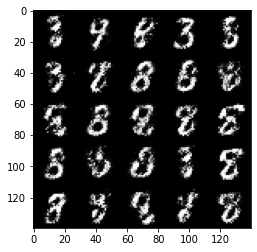

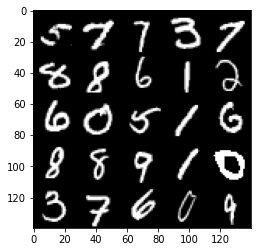

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 59, step 28000: Generator loss: 2.7691485383510583, Discriminator loss: 0.4236533578038219


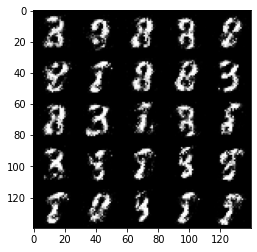

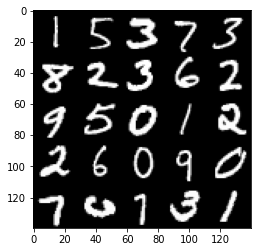

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 61, step 29000: Generator loss: 2.760753592729569, Discriminator loss: 0.4158542320579288


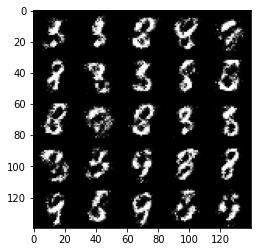

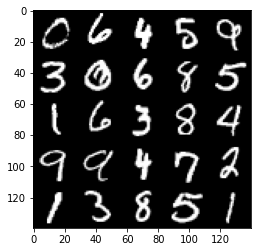

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 63, step 30000: Generator loss: 2.747935713291167, Discriminator loss: 0.42860884253680653


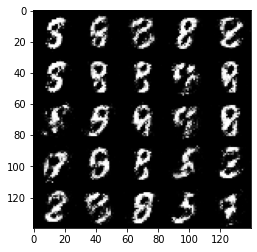

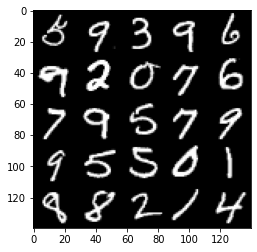

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 66, step 31000: Generator loss: 2.5803658246994017, Discriminator loss: 0.48516907827556227


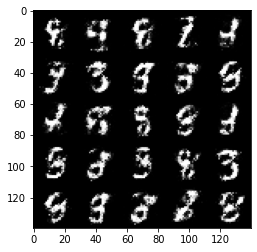

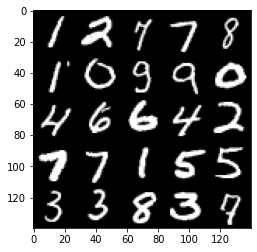

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 68, step 32000: Generator loss: 2.5687157030105614, Discriminator loss: 0.4550536075830465


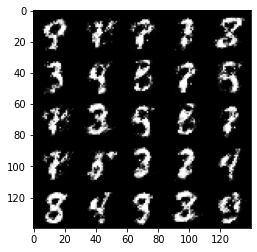

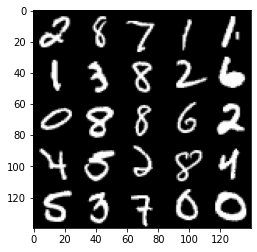

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 70, step 33000: Generator loss: 2.5616303726434713, Discriminator loss: 0.45484968662261954


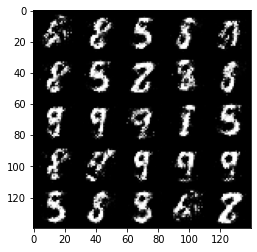

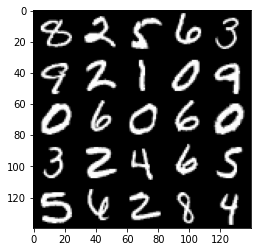

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 72, step 34000: Generator loss: 2.539534527301789, Discriminator loss: 0.4812641345262534


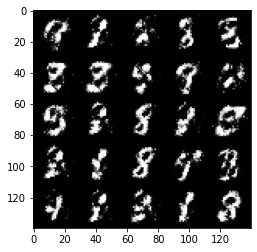

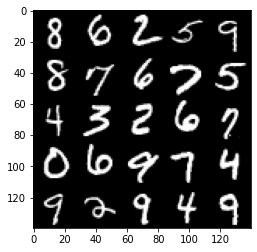

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 74, step 35000: Generator loss: 2.5458081551790204, Discriminator loss: 0.49169995330274135


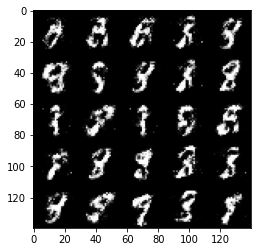

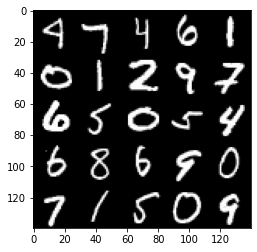

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 76, step 36000: Generator loss: 2.5246829566955555, Discriminator loss: 0.45475186964869485


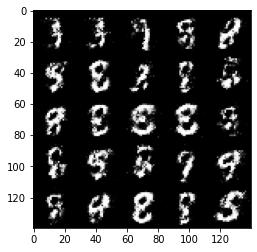

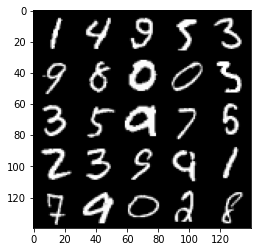

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 78, step 37000: Generator loss: 2.54760913300514, Discriminator loss: 0.48144231870770376


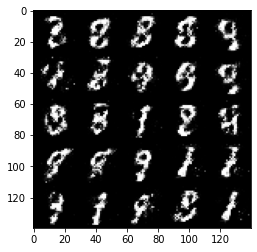

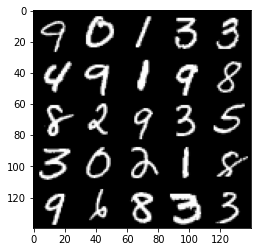

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 81, step 38000: Generator loss: 2.454664565443994, Discriminator loss: 0.4770565217137334


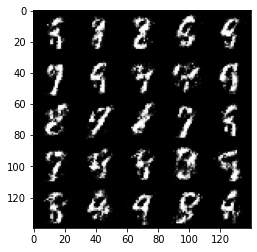

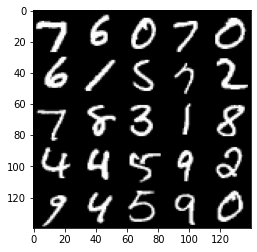

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 83, step 39000: Generator loss: 2.4292345157861677, Discriminator loss: 0.5188911139070985


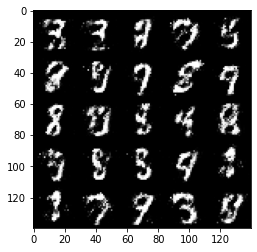

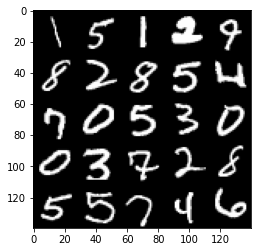

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 85, step 40000: Generator loss: 2.45267349612713, Discriminator loss: 0.4837557603120803


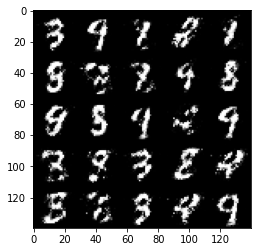

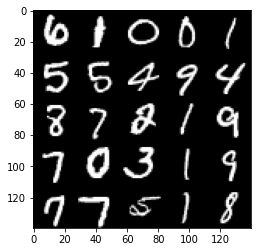

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 87, step 41000: Generator loss: 2.4338230900764466, Discriminator loss: 0.521497077316045


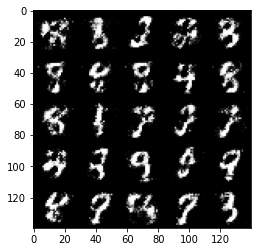

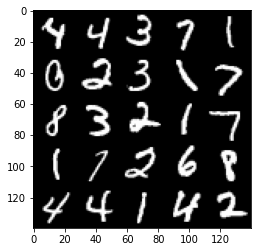

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 89, step 42000: Generator loss: 2.2767403069734575, Discriminator loss: 0.5559404529929161


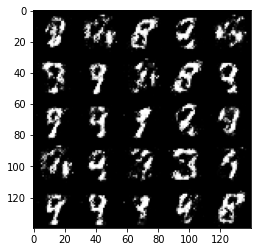

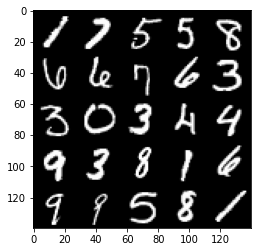

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 91, step 43000: Generator loss: 2.311786950469018, Discriminator loss: 0.5450195828676221


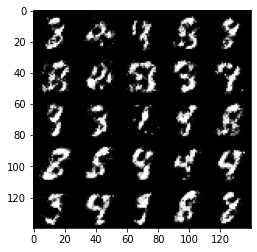

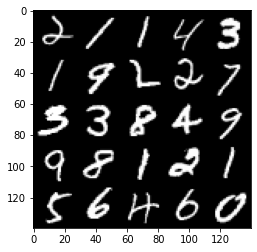

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 93, step 44000: Generator loss: 2.29588333320618, Discriminator loss: 0.5598374198973181


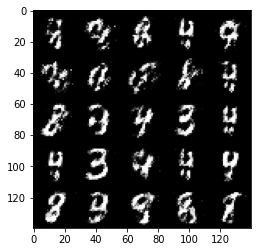

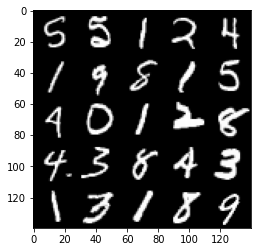

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 95, step 45000: Generator loss: 2.3035031976699805, Discriminator loss: 0.5562248667478563


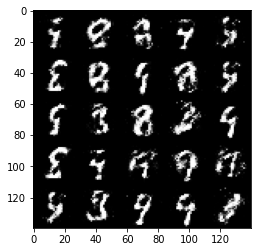

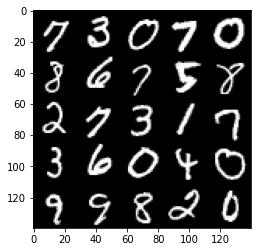

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 98, step 46000: Generator loss: 2.16544204556942, Discriminator loss: 0.628550231456757


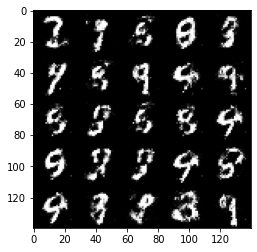

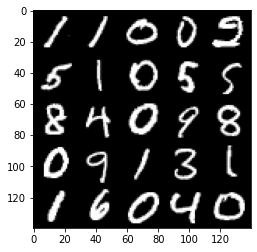

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 100, step 47000: Generator loss: 2.1087686811685593, Discriminator loss: 0.6616116836667058


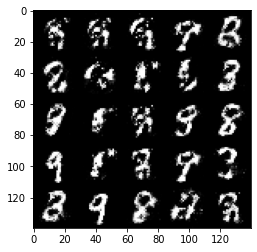

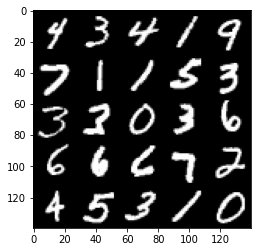

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 102, step 48000: Generator loss: 2.048590919137002, Discriminator loss: 0.669661381363869


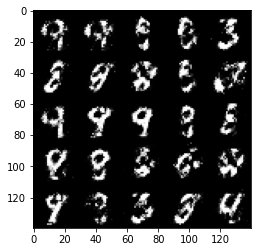

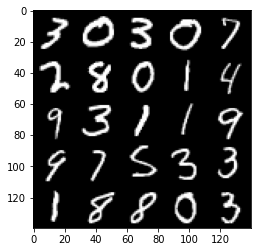

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 104, step 49000: Generator loss: 2.139914138078687, Discriminator loss: 0.5926891435384749


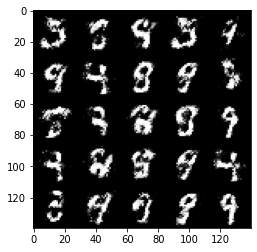

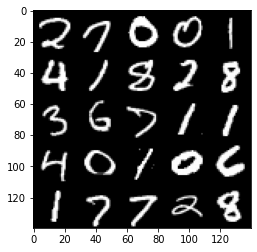

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 106, step 50000: Generator loss: 2.114986282110212, Discriminator loss: 0.6037514951229095


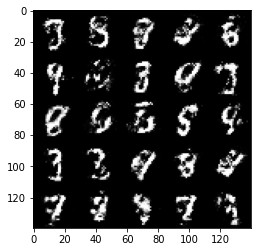

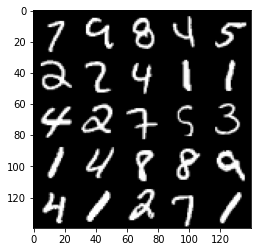

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 108, step 51000: Generator loss: 2.068985927224158, Discriminator loss: 0.6420290881991378


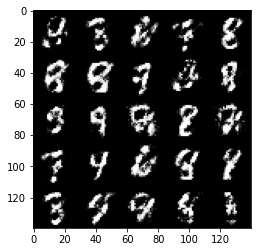

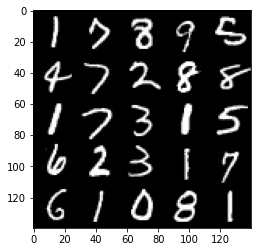

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 110, step 52000: Generator loss: 2.0087893503904364, Discriminator loss: 0.6667517067193984


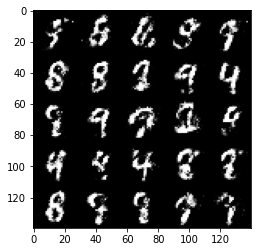

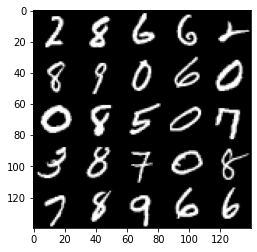

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 113, step 53000: Generator loss: 1.9319998311996467, Discriminator loss: 0.7047829389870174


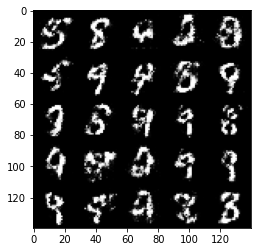

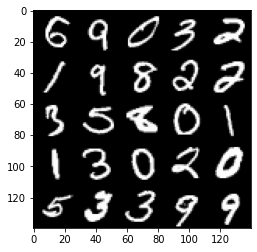

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 115, step 54000: Generator loss: 1.8667606527805323, Discriminator loss: 0.7406729333996777


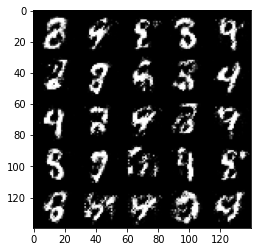

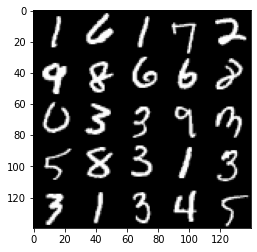

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 117, step 55000: Generator loss: 1.8373836702108362, Discriminator loss: 0.7449018853902807


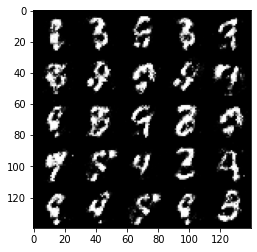

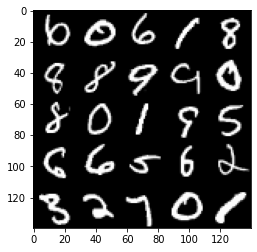

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 119, step 56000: Generator loss: 1.827718311190604, Discriminator loss: 0.7265749335885058


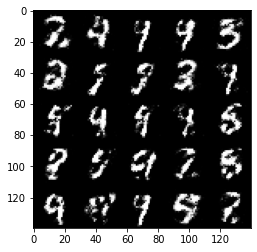

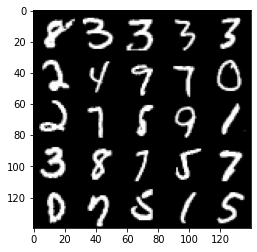

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 121, step 57000: Generator loss: 1.902180367588998, Discriminator loss: 0.6966250941455367


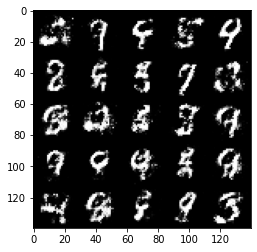

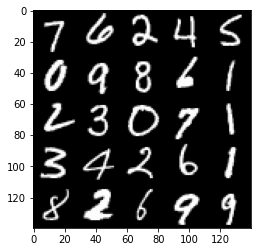

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 123, step 58000: Generator loss: 1.872488908410074, Discriminator loss: 0.6934461298882959


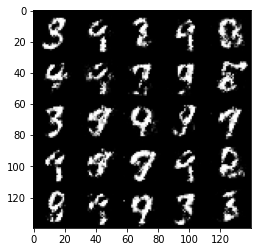

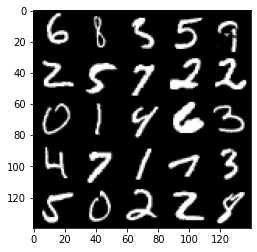

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 125, step 59000: Generator loss: 1.9179260293245304, Discriminator loss: 0.675692105263472


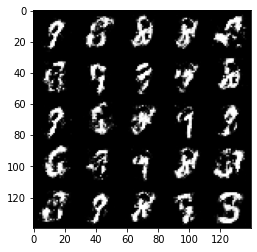

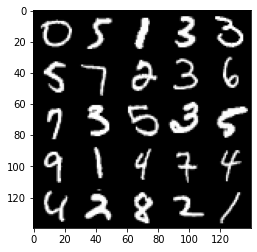

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 127, step 60000: Generator loss: 1.8298170957565285, Discriminator loss: 0.7219734955430043


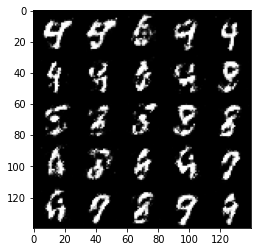

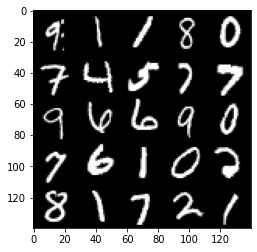

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 130, step 61000: Generator loss: 1.8599703545570385, Discriminator loss: 0.7234826174974432


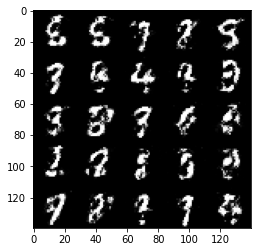

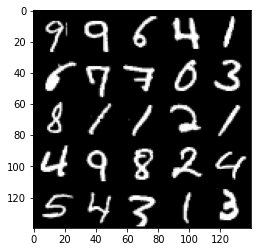

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 132, step 62000: Generator loss: 1.7791189626455328, Discriminator loss: 0.7479063633084293


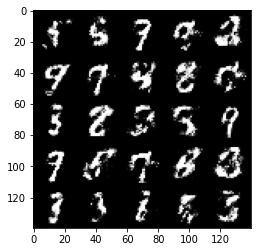

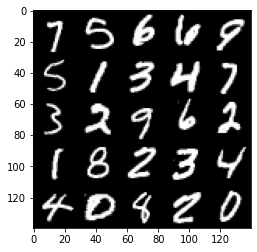

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 134, step 63000: Generator loss: 1.7407806274890896, Discriminator loss: 0.7691429969072346


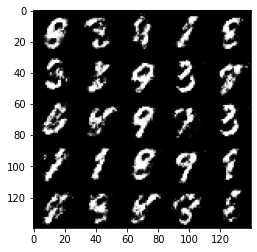

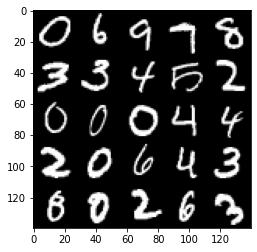

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 136, step 64000: Generator loss: 1.7389563808441175, Discriminator loss: 0.7599901928901659


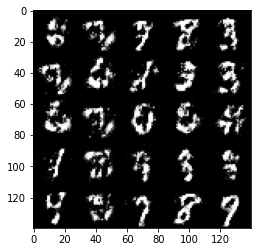

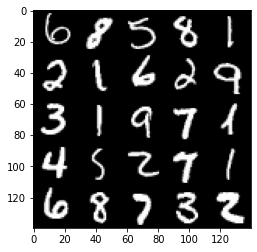

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 138, step 65000: Generator loss: 1.7292035007476814, Discriminator loss: 0.7975682402253155


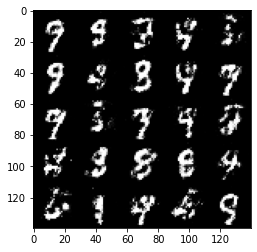

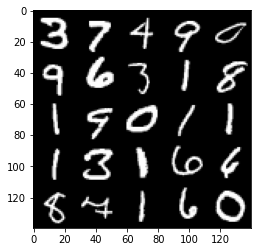

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 140, step 66000: Generator loss: 1.7037148661613457, Discriminator loss: 0.7854525377154344


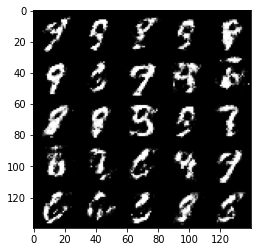

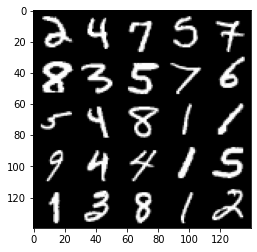

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 142, step 67000: Generator loss: 1.6361051061153422, Discriminator loss: 0.8386205318570122


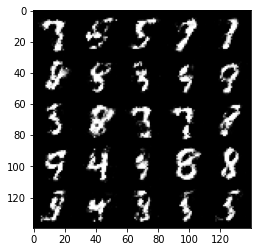

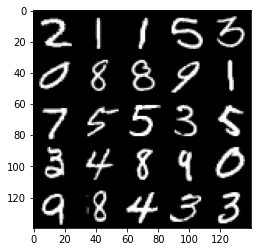

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 144, step 68000: Generator loss: 1.6278161096572858, Discriminator loss: 0.7975320146679885


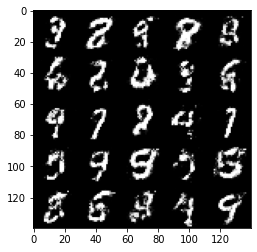

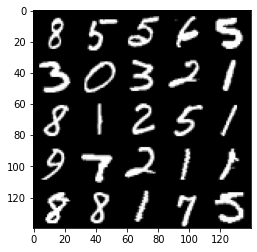

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 147, step 69000: Generator loss: 1.6576337609291067, Discriminator loss: 0.7961396290659911


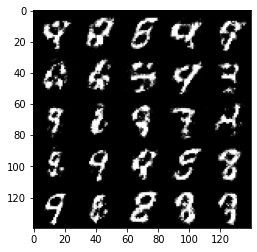

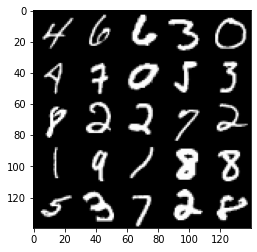

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 149, step 70000: Generator loss: 1.571668566226959, Discriminator loss: 0.8885923042893391


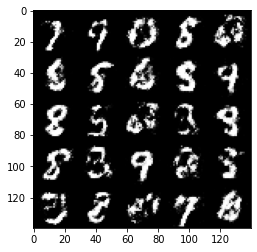

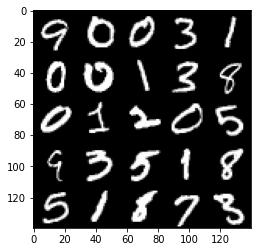

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 151, step 71000: Generator loss: 1.526673962950708, Discriminator loss: 0.8793586266636828


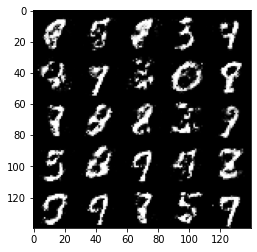

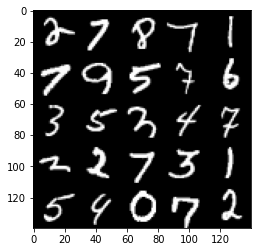

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 153, step 72000: Generator loss: 1.5070217299461384, Discriminator loss: 0.8905793648362161


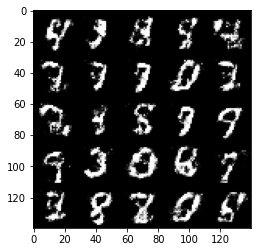

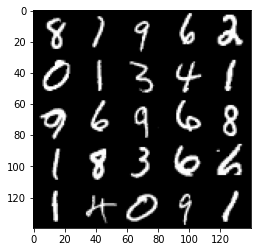

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 155, step 73000: Generator loss: 1.4901944296359977, Discriminator loss: 0.9279103935360903


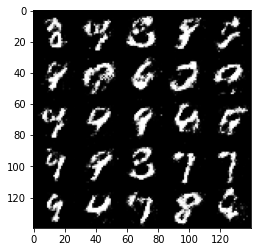

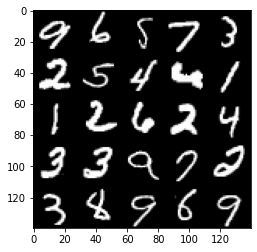

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 157, step 74000: Generator loss: 1.4479294210672393, Discriminator loss: 0.9193530343174935


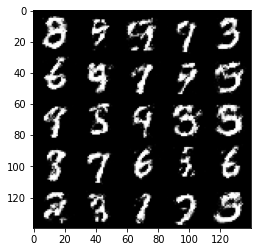

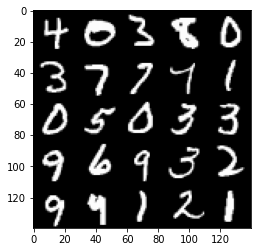

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 159, step 75000: Generator loss: 1.4952722922563568, Discriminator loss: 0.8781571481823923


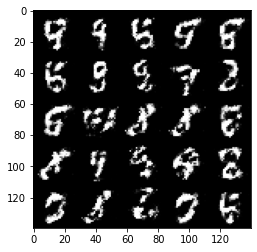

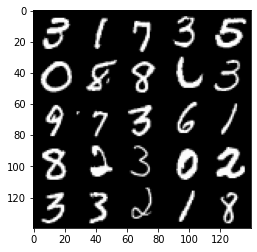

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 162, step 76000: Generator loss: 1.534897186040878, Discriminator loss: 0.875940810739996


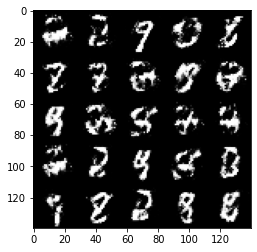

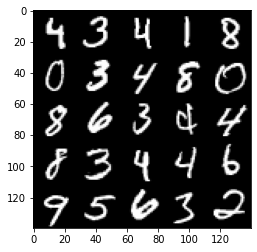

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 164, step 77000: Generator loss: 1.4905328506231295, Discriminator loss: 0.9191518810987478


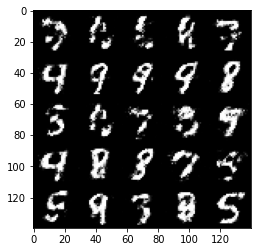

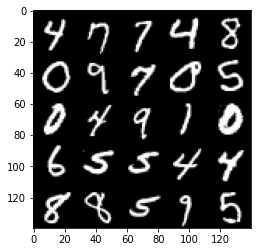

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 166, step 78000: Generator loss: 1.4617247608900064, Discriminator loss: 0.9086658226847644


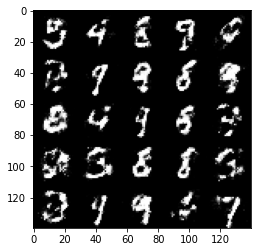

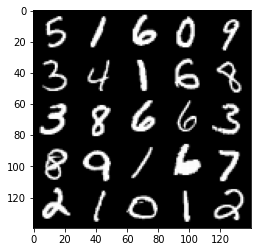

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 168, step 79000: Generator loss: 1.4133778359889984, Discriminator loss: 0.9414579557776456


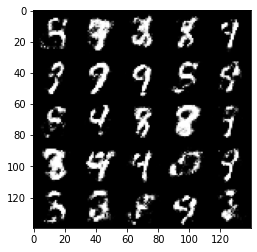

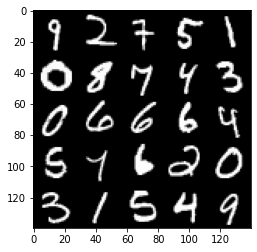

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 170, step 80000: Generator loss: 1.425706955552103, Discriminator loss: 0.9127698171138765


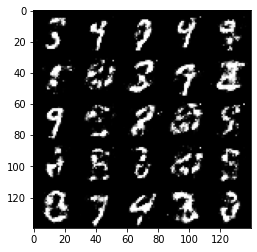

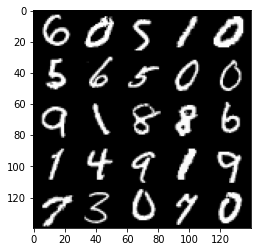

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 172, step 81000: Generator loss: 1.5030162851810454, Discriminator loss: 0.8910200207829476


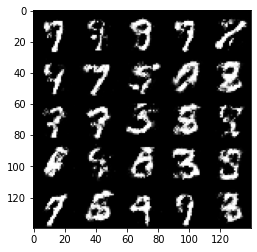

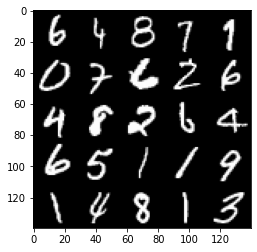

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 174, step 82000: Generator loss: 1.462535083770751, Discriminator loss: 0.9505947344899173


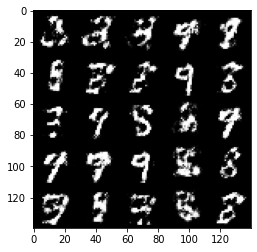

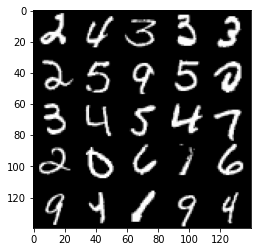

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 176, step 83000: Generator loss: 1.4025962069034579, Discriminator loss: 0.9829639670252792


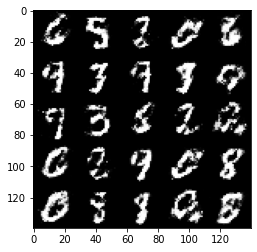

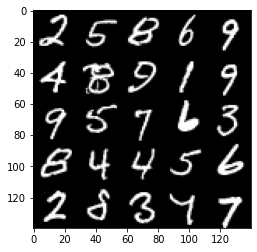

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 179, step 84000: Generator loss: 1.3851901129484179, Discriminator loss: 0.9629375964403164


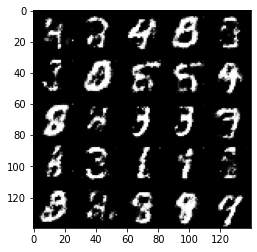

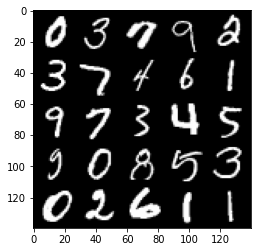

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 181, step 85000: Generator loss: 1.3462820334434515, Discriminator loss: 0.9877420398592959


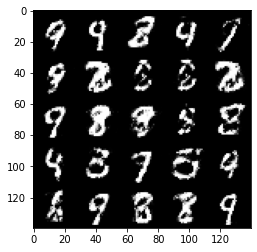

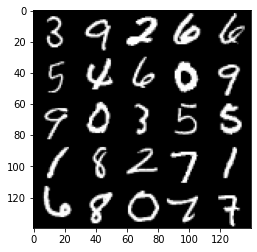

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 183, step 86000: Generator loss: 1.3522163643836975, Discriminator loss: 0.9809812358021741


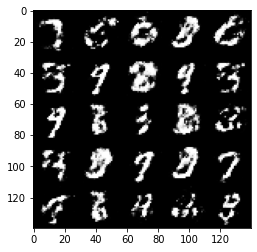

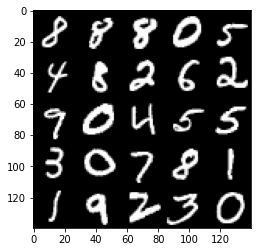

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 185, step 87000: Generator loss: 1.3390326257944123, Discriminator loss: 0.9894448484778402


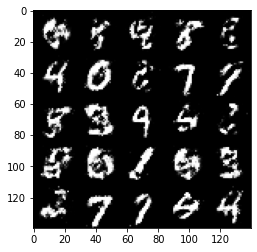

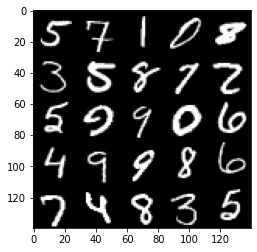

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 187, step 88000: Generator loss: 1.3187052963972083, Discriminator loss: 1.0198759362697607


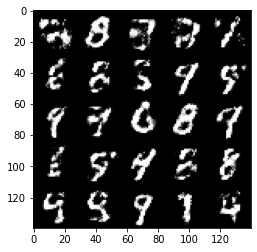

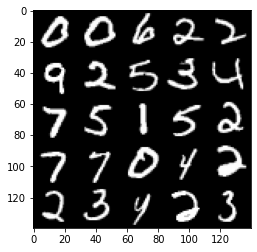

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 189, step 89000: Generator loss: 1.317332191467285, Discriminator loss: 1.0148289912343027


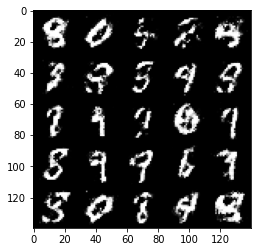

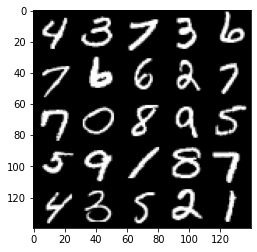

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 191, step 90000: Generator loss: 1.3050633821487438, Discriminator loss: 0.9877729893922815


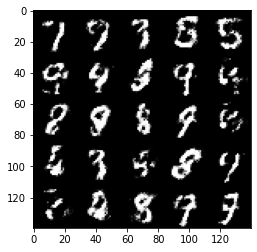

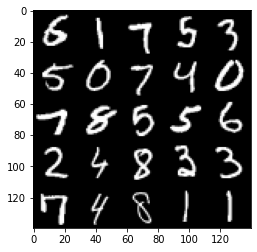

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 194, step 91000: Generator loss: 1.3303250069618222, Discriminator loss: 0.9854642156958573


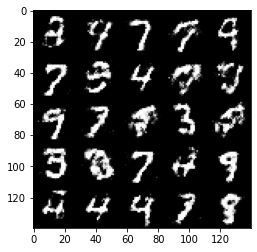

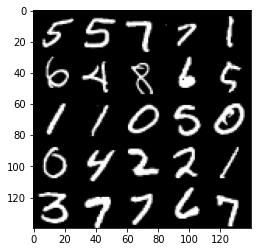

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 196, step 92000: Generator loss: 1.2813232901692393, Discriminator loss: 1.0120452410578742


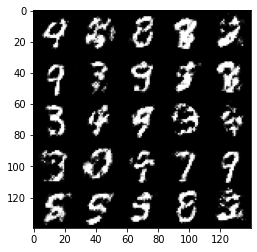

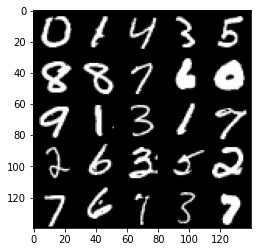

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 198, step 93000: Generator loss: 1.2995046323537829, Discriminator loss: 0.9988235285282137


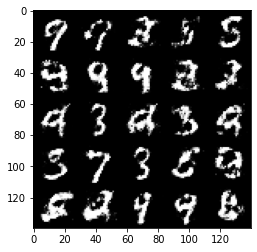

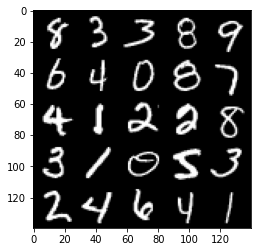

  0%|          | 0/469 [00:00<?, ?it/s]

In [12]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False

for epoch in range(n_epochs):
    for real in tqdm(train_dataset):
        cur_batch_size = len(real)
        noise = get_noise(cur_batch_size, z_dim)

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            fake = gen(noise, training=True)

            real_output = disc(real, training=True)
            fake_output = disc(fake, training=True)

            gen_loss = BCELoss(tf.ones_like(fake_output), fake_output)
            disc_loss = BCELoss(tf.ones_like(real_output), real_output) + BCELoss(tf.zeros_like(fake_output), fake_output)
        
        grads_of_gen = gen_tape.gradient(gen_loss, gen.trainable_variables)
        grads_of_disc = disc_tape.gradient(disc_loss, disc.trainable_variables)

        gen_opt.apply_gradients(zip(grads_of_gen, gen.trainable_variables))
        disc_opt.apply_gradients(zip(grads_of_disc, disc.trainable_variables))

        mean_discriminator_loss += disc_loss.numpy() / display_step
        mean_generator_loss += gen_loss.numpy() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f'Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}')
            fake_noise = get_noise(cur_batch_size, z_dim)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1